<table>
<tr>                                                                                   
     <th>
         <div style='padding:15px;color:#030aa7;font-size:240%;text-align: center;font-style: italic;font-weight: bold;font-family: Georgia, serif'><a href="https://www.kaggle.com/datasets/uciml/breast-cancer-wisconsin-data">Breast Cancer Wisconsin (Diagnostic)</a></div>
     </th>
     <th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/breast_cancer_logo.png" width="96"></th>
 </tr>
</table>

<div style='text-align: center'>
<img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/breast_cancer.png" width="512">
</div>

<div style='padding:15px;color:#030aa7;font-size:100%;text-align: left;font-family: Georgia, serif'>Les variables sont calculées à partir d'une image numérisée d'une ponction d'aspiration à l'aiguille fine (FNA) utilisée pour obtenir des échantillons à partir de ganglions lymphatique. Elles décrivent les caractéristiques des noyaux cellulaires présents sur l'image.</div>

<div style='padding:15px;color:#030aa7;font-size:100%;text-align: left;font-family: Georgia, serif'><a href="https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic">Veuillez vous référer à la page <span style="font-weight: bold; color: blue">UC Irvine Machine Learning Repository</span>
 officielle pour plus de détails.</a></div>

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Introduction</div></b>
## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Import libriries </div></b>

In [1]:
import pandas as pd, numpy as np, seaborn as sns, warnings, os, sys, time, copy as cp
from datetime import datetime as dt
from matplotlib import pyplot as plt

import matplotlib.font_manager as fm
import plotly.express as px
import plotly.graph_objs as go

font1 = fm.FontProperties(size=20)
font2 = fm.FontProperties(size=24)

warnings.filterwarnings(action="ignore")

if int(str(sns.__version__).split('.')[1]) > 8 : 
    plt.style.use('seaborn-v0_8-darkgrid')
else:
    plt.style.use('seaborn-darkgrid')
sns.set(font_scale=2)

In [2]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import fcluster
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [3]:
from matplotlib.colors import ListedColormap
from itertools import cycle
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction import DictVectorizer
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier, RidgeCV
from sklearn.svm import NuSVC, SVC, OneClassSVM
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import ConstantKernel, RBF, RationalQuadratic, ExpSineSquared, DotProduct, Matern, WhiteKernel

from sklearn.tree import DecisionTreeClassifier, export_graphviz, plot_tree
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB, ComplementNB
from lightgbm import LGBMClassifier
from xgboost  import XGBClassifier
from sklearn.metrics import roc_curve, auc

from sklearn.metrics import make_scorer, confusion_matrix, roc_curve, auc, accuracy_score, log_loss, hamming_loss, \
                            precision_score, recall_score, f1_score, fbeta_score, jaccard_score, \
                            precision_recall_curve, average_precision_score, balanced_accuracy_score, \
                            classification_report
from sklearn.metrics import roc_auc_score, zero_one_loss
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.model_selection import KFold, StratifiedKFold, RepeatedKFold, \
                                    RepeatedStratifiedKFold, LeavePOut, LeaveOneGroupOut, \
                                    LeavePGroupsOut, ShuffleSplit, StratifiedShuffleSplit, TimeSeriesSplit, GridSearchCV

from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier,OneVsOneClassifier

from sklearn.neighbors  import LocalOutlierFactor
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble   import IsolationForest
from sklearn.svm        import OneClassSVM

In [4]:
sys.path.append(os.path.abspath('../outils/'))
if 'initDictionnaireClassificateurs' in sys.modules.keys():  del(sys.modules['initDictionnaireClassificateurs'])
if 'executionEssaiComparaisonClassificateurs' in sys.modules.keys():  del(sys.modules['executionEssaiComparaisonClassificateurs'])    
if 'initProjet' in sys.modules.keys():  del(sys.modules['initProjet'])    
if 'sauvegarderImage' in sys.modules.keys():  del(sys.modules['sauvegarderImage'])    
if 'sauvegarderImageSNS' in sys.modules.keys():  del(sys.modules['sauvegarderImageSNS'])    
if 'affichageEvolutionMetriques' in sys.modules.keys():  del(sys.modules['affichageEvolutionMetriques'])    
if 'affichageROC' in sys.modules.keys():  del(sys.modules['affichageROC'])        
if 'executeValidationCroisee' in sys.modules.keys():  del(sys.modules['executeValidationCroisee'])            

from classificationBinaires import initDictionnaireClassificateurs, executionEssaiComparaisonClassificateurs,\
                                   sauvegarderImage, sauvegarderImageSNS, initProjet, affichageEvolutionMetriques, \
                                   affichageROC, executeValidationCroisee

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Outils du document</div></b>

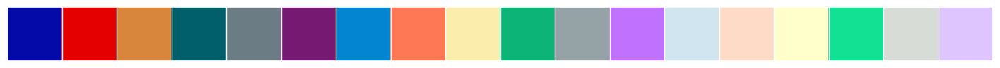

In [5]:
palette = [ "#030aa7", "#e50000", "#d8863b", "#005f6a", "#6b7c85", "#751973", 
            "#0485d1", "#ff7855", "#fbeeac", "#0cb577", "#95a3a6", "#c071fe", 
            "#d1e5f0", "#fddbc7", "#ffffcb", "#12e193", "#d8dcd6", "#dfc5fe", 
          ]
sns.palplot(sns.color_palette(palette))

In [6]:
repertoireRacine  = '.'
nomProjet         = 'BreastCancerWisconsin'

repertoireRacine,repertoireProjet,repertoireDonnees,repertoireImages = initProjet(repertoireRacine,'DiabetesHealthIndicators')

In [7]:
def formatPct(pct, allvals):
    total = int(round(pct/100. * np.sum(allvals)))
    return "{:.2f}%\n({:d})".format(pct, total)    

In [8]:
def affichageDistribution(colonne,couleur,ax):
    graph = sns.distplot(colonne, color=couleur, ax=ax)
    graph.set(ylabel=None)
    moyenne, mediane = float(colonne.mean()), \
                   float(colonne.median())
    
    ax.axvline(moyenne, color='g', linestyle='-', label="mean   = {0:0.1f}".format(moyenne), lw=2)
    ax.axvline(mediane, color='b', linestyle='--', label="median = {0:0.1f}".format(mediane), lw=2)
    graph.legend(loc="upper right")

In [9]:
def afficheDendrogram(*args, **kwargs):
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)

    ddata = dendrogram(*args, **kwargs)

    if not kwargs.get('no_plot', False):
        plt.title('Classification Hiérarchique Ascendante')
        plt.xlabel('Villes ou (taille du cluster)')
        plt.ylabel('Distance')
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                             textcoords='offset points',
                             va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Lecture des données</div></b>
<table>
        <tr>                                                                                   
             <th style='padding:15px;color:#030aa7;font-size:150%;text-align: left;font-weight: bold;font-family: Georgia, serif'>data.csv</th>
             <th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/breast_cancer_logo.png" width="128"></th>
        </tr>  
<table>   
<table>
        <tr>                                                                                   
             <th  style="text-align:left;background-color:#053061;color:white;"> </th>
             <th  style="text-align:left;background-color:#053061;color:white;">Colonne initiale </th>
             <th  style="text-align:left;background-color:#053061;color:white;">Description</th>
        </tr>    
    <tr>
        <th  style="text-align:left"> </th>                            
        <th  style="text-align:left;font-style: italic">ID number</th> 
        <th  style="text-align:left;font-style: italic">index</th>
    </tr>    
    <tr>
        <th  style="text-align:left">0 </th>                            
        <th  style="text-align:left;color:red;font-style: italic">Diagnosis</th> 
        <th  style="text-align:left;color:red;font-style: italic">M = malignant, B = benign</th>
    </tr>    
    <tr>
        <th  style="text-align:left">1 </th>                            
        <th  style="text-align:left">radius </th>                            
        <th  style="text-align:left"></th>
    </tr>    
    <tr>
        <th  style="text-align:left">2 </th>                            
        <th  style="text-align:left">texture </th>                          
        <th  style="text-align:left">standard deviation of gray-scale values</th>
    </tr>    
    <tr>
        <th  style="text-align:left">3 </th>                            
        <th  style="text-align:left">perimeter </th>                         
        <th  style="text-align:left"></th>
    </tr>    
    <tr>
        <th  style="text-align:left">4 </th>                            
        <th  style="text-align:left">area</th>                               
        <th  style="text-align:left"></th>
    </tr> 
    <tr>
        <th  style="text-align:left">5 </th>                            
        <th  style="text-align:left">smoothness </th>                            
        <th  style="text-align:left">local variation in radius lengths</th>
    </tr>  
    <tr>
        <th  style="text-align:left">6 </th>                            
        <th  style="text-align:left">compactness </th>                      
        <th  style="text-align:left">$\frac{perimeter^2}{area - 1.0}$</th>
    </tr>    
    <tr>
        <th  style="text-align:left">7 </th>                            
        <th  style="text-align:left">concavity </th>              
        <th  style="text-align:left">severity of concave portions of the contour</th>
    </tr>  
    <tr>
        <th  style="text-align:left">8 </th>                            
        <th  style="text-align:left">concave points </th>                            
        <th  style="text-align:left">number of concave portions of the contour</th>
    </tr>   
    <tr>
        <th  style="text-align:left">9 </th>                            
        <th  style="text-align:left">symmetry </th>                           
        <th  style="text-align:left"></th>
    </tr> 
    <tr>
        <th  style="text-align:left">10 </th>                            
        <th  style="text-align:left">fractal dimension </th>                 
        <th  style="text-align:left">"coastline approximation" - 1</th>
    </tr>    
</table>

<div style='padding:15px;color:#030aa7;font-size:100%;text-align: left;font-family: Georgia, serif'>La moyenne, l’écart type et la « pire valeur » ou la plus grande (moyenne des trois valeurs les plus grandes) de ces variables ont été calculées pour chaque image, ce qui a donné lieu à 30 variables.</div>

In [10]:
donnees = pd.read_csv('../donnees/Breast Cancer Wisconsin (Diagnostic)/data.csv', index_col='id').drop(columns='Unnamed: 32')
donnees.sort_index(axis=1, inplace=True)
dictDiagnosis,dictRDiagnosis = {'M':1,'B':0},{1:'M',0:'B'}
cible = 'diagnosis'

In [11]:
donnees.sample(5)

,area_mean,area_se,area_worst,compactness_mean,compactness_se,compactness_worst,concave points_mean,concave points_se,concave points_worst,concavity_mean,...,radius_worst,smoothness_mean,smoothness_se,smoothness_worst,symmetry_mean,symmetry_se,symmetry_worst,texture_mean,texture_se,texture_worst
id,,,,,,,,,,,,,,,,,,,,,
8910506,512.2,18.24,597.5,0.06219,0.02178,0.18080,0.01615,0.006330,0.05780,0.03900,...,13.90,0.09425,0.005518,0.1256,0.2010,0.02593,0.3604,16.21,1.219,23.64
855625,1104.0,104.90,1651.0,0.21900,0.10060,0.74440,0.09961,0.026380,0.24930,0.21070,...,24.09,0.09081,0.006548,0.1247,0.2310,0.05333,0.4670,24.81,1.666,33.17
892399,334.2,20.56,362.7,0.06797,0.01443,0.08614,0.01875,0.012500,0.03125,0.02495,...,10.93,0.10150,0.010170,0.1143,0.1695,0.03464,0.2227,23.09,1.143,24.22
9112085,557.2,28.93,705.6,0.07426,0.01246,0.14210,0.03264,0.009128,0.07763,0.02819,...,15.05,0.09245,0.005841,0.1172,0.1375,0.01564,0.2196,30.72,1.924,41.61
905978,271.2,25.17,359.4,0.06159,0.01674,0.11930,0.01257,0.008674,0.03770,0.02047,...,10.85,0.10440,0.014740,0.1526,0.2025,0.03044,0.2872,21.70,2.878,31.24


>> <div style='padding:15px;color:#030aa7;background-color:#d8dcd6;font-size:120%;text-align: left;font-family: Georgia, serif'>Il n'y a pas de valeurs non renseignées</div>

In [12]:
donnees.isna().sum().sum()

0

In [13]:
donnees.describe().style.format("{:0.2f}") 

,area_mean,area_se,area_worst,compactness_mean,compactness_se,compactness_worst,concave points_mean,concave points_se,concave points_worst,concavity_mean,concavity_se,concavity_worst,fractal_dimension_mean,fractal_dimension_se,fractal_dimension_worst,perimeter_mean,perimeter_se,perimeter_worst,radius_mean,radius_se,radius_worst,smoothness_mean,smoothness_se,smoothness_worst,symmetry_mean,symmetry_se,symmetry_worst,texture_mean,texture_se,texture_worst
count,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00
mean,654.89,40.34,880.58,0.10,0.03,0.25,0.05,0.01,0.11,0.09,0.03,0.27,0.06,0.00,0.08,91.97,2.87,107.26,14.13,0.41,16.27,0.10,0.01,0.13,0.18,0.02,0.29,19.29,1.22,25.68
std,351.91,45.49,569.36,0.05,0.02,0.16,0.04,0.01,0.07,0.08,0.03,0.21,0.01,0.00,0.02,24.30,2.02,33.60,3.52,0.28,4.83,0.01,0.00,0.02,0.03,0.01,0.06,4.30,0.55,6.15
min,143.50,6.80,185.20,0.02,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.05,0.00,0.06,43.79,0.76,50.41,6.98,0.11,7.93,0.05,0.00,0.07,0.11,0.01,0.16,9.71,0.36,12.02
25%,420.30,17.85,515.30,0.06,0.01,0.15,0.02,0.01,0.06,0.03,0.02,0.11,0.06,0.00,0.07,75.17,1.61,84.11,11.70,0.23,13.01,0.09,0.01,0.12,0.16,0.02,0.25,16.17,0.83,21.08
50%,551.10,24.53,686.50,0.09,0.02,0.21,0.03,0.01,0.10,0.06,0.03,0.23,0.06,0.00,0.08,86.24,2.29,97.66,13.37,0.32,14.97,0.10,0.01,0.13,0.18,0.02,0.28,18.84,1.11,25.41
75%,782.70,45.19,1084.00,0.13,0.03,0.34,0.07,0.01,0.16,0.13,0.04,0.38,0.07,0.00,0.09,104.10,3.36,125.40,15.78,0.48,18.79,0.11,0.01,0.15,0.20,0.02,0.32,21.80,1.47,29.72
max,2501.00,542.20,4254.00,0.35,0.14,1.06,0.20,0.05,0.29,0.43,0.40,1.25,0.10,0.03,0.21,188.50,21.98,251.20,28.11,2.87,36.04,0.16,0.03,0.22,0.30,0.08,0.66,39.28,4.88,49.54


# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Statistiques descriptives et analyse de données</div></b>

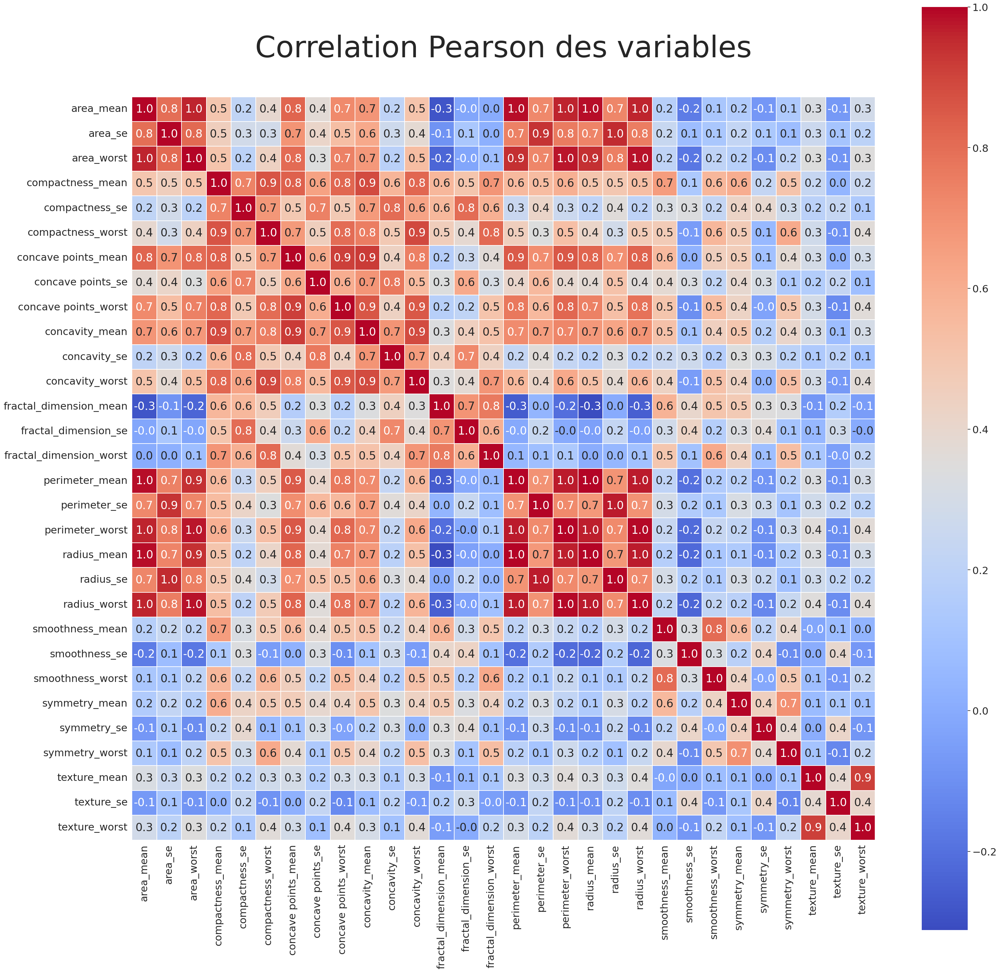

In [14]:
plt.figure(figsize=(36,36))
plt.title('Correlation Pearson des variables', y=1.05, size=64)
sns.heatmap(donnees.drop(columns=cible).corr(), fmt= '.1f',linewidths=0.3,vmax=1.0, 
            square=True, cmap='coolwarm', linecolor='white', annot=True);

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Separation des données pour l'apprentissage</div></b>

<img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/echantillonApprentissageTest.png" width="800">

In [15]:
donnees = pd.read_parquet(os.path.join(repertoireDonnees,'donnees_echantillons.parquet'))
X_train, X_test = \
                  donnees.loc[donnees['échantillon']=='apprentissage',donnees.drop(columns=[cible,'échantillon']).columns],\
                  donnees.loc[donnees['échantillon']=='test',donnees.drop(columns=[cible,'échantillon']).columns]

y_train, y_test = \
                  donnees.loc[donnees['échantillon']=='apprentissage',cible].apply(lambda x: dictDiagnosis[x]),\
                  donnees.loc[donnees['échantillon']=='test',cible].apply(lambda x: dictDiagnosis[x])

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((455, 30), (114, 30), (455,), (114,))

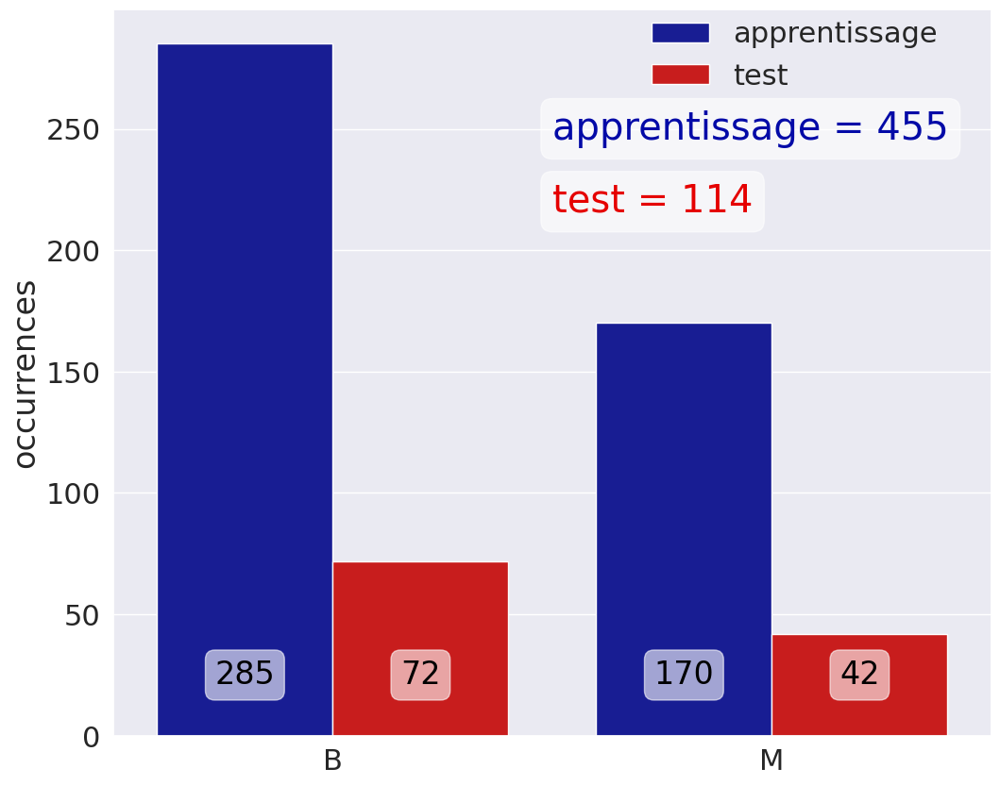

In [16]:
plt.figure(figsize=(12,10))
graph = sns.countplot(x=cible,
                      hue='échantillon',
                      data=donnees.sort_values([cible,'échantillon']), 
                      palette=palette
                     );

for i,nb in enumerate(donnees.groupby([cible,'échantillon'])[cible].count()):
    if i%2 == 0 : val = i/2
    delta =  val - 0.2 +(i%2)*0.4
    graph.text(
                delta ,
                25,
                nb,
                color='black',
#                 rotation='vertical',
#                 size='large',
#                 fontsize='large',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.6),
                verticalalignment='center',
                horizontalalignment='center',
               )
affichage = donnees.groupby('échantillon').agg({'diagnosis':'count'})
graph.text(
                0.5 ,
                250,
                f"apprentissage = {affichage.loc['apprentissage','diagnosis']}",
                color="#030aa7",
                fontsize='large',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.6),
                verticalalignment='center',
                horizontalalignment='left',
               )
graph.text(
                0.5 ,
                220,
                f"test = {affichage.loc['test','diagnosis']}",
                color="#e50000",
                fontsize='large',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.6),
                verticalalignment='center',
                horizontalalignment='left',
               )

graph.set_ylabel('occurrences');
graph.set_xlabel('');
graph.legend(bbox_to_anchor=(.6, 1), loc='upper left', borderaxespad=0);

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Déclaration des classificateurs </div></b>

In [17]:
classificateursDict =  initDictionnaireClassificateurs(arbres=12)
classificateursDict.pop('LightGBM'),\
classificateursDict.pop('XGBoost'),\
classificateursDict.pop('Stochastic_GD')

(LGBMClassifier(min_child_samples=10, min_split_gain=0.01, n_estimators=128,
                num_leaves=20, reg_alpha=0.1, reg_lambda=20),
 XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, device=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric='auc', feature_types=None,
               gamma=None, grow_policy=None, importance_type=None,
               interaction_constraints=None, learning_rate=None, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=6, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               multi_strategy=None, n_estimators=128, n_jobs=None,
               num_parallel_tree=None, random_state=None, ...),
 SGDClassifier(alpha=0.01, loss='log', max_iter=200))

In [18]:
classificateursDict

{'Random_Forest': RandomForestClassifier(max_depth=6, max_features=3, min_samples_split=4,
                        n_estimators=128, n_jobs=-1),
 'AdaBoost': AdaBoostClassifier(n_estimators=128),
 'LogisticRegression': LogisticRegression(C=0.81113, max_iter=3000, n_jobs=-1),
 'Gaussian_Process': GaussianProcessClassifier(n_jobs=-1),
 'Nearest_Neighbors': KNeighborsClassifier(algorithm='ball_tree', n_jobs=-1, n_neighbors=17, p=1,
                      weights='distance'),
 'Linear_SVM': SVC(C=0.1, kernel='linear', probability=True),
 'Radial_NuSVM': NuSVC(gamma=0.5, nu=0.195, probability=True),
 'Poly_NuSVM': NuSVC(kernel='poly', nu=0.1, probability=True),
 'GaussianNaiveBayes': GaussianNB(),
 'QuadraticDiscriminant': QuadraticDiscriminantAnalysis(),
 'Neural_Net': MLPClassifier(alpha=1)}

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Essai initial avec les donnes sans aucun traitement</div></b> 

AdaBoost               0.9737	--	Area under the ROC curve : 0.9967	--	Exécution  :.20s
GaussianNaiveBayes     0.9211	--	Area under the ROC curve : 0.9835	--	Exécution  :.01s
Gaussian_Process       0.7105	--	Area under the ROC curve : 0.5417	--	Exécution  :.19s
Linear_SVM             0.9561	--	Area under the ROC curve : 0.9927	--	Exécution  :.26s
LogisticRegression     0.9561	--	Area under the ROC curve : 0.9937	--	Exécution  :.54s
Nearest_Neighbors      0.9474	--	Area under the ROC curve : 0.9780	--	Exécution  :.04s
Neural_Net             0.9474	--	Area under the ROC curve : 0.9878	--	Exécution  :.16s
Poly_NuSVM             0.6667	--	Area under the ROC curve : 0.1925	--	Exécution  :.03s
QuadraticDiscriminant  0.9561	--	Area under the ROC curve : 0.9850	--	Exécution  :.01s
Radial_NuSVM           0.6316	--	Area under the ROC curve : 0.4514	--	Exécution  :.07s
Random_Forest          0.9386	--	Area under the ROC curve : 0.9851	--	Exécution  :.44s


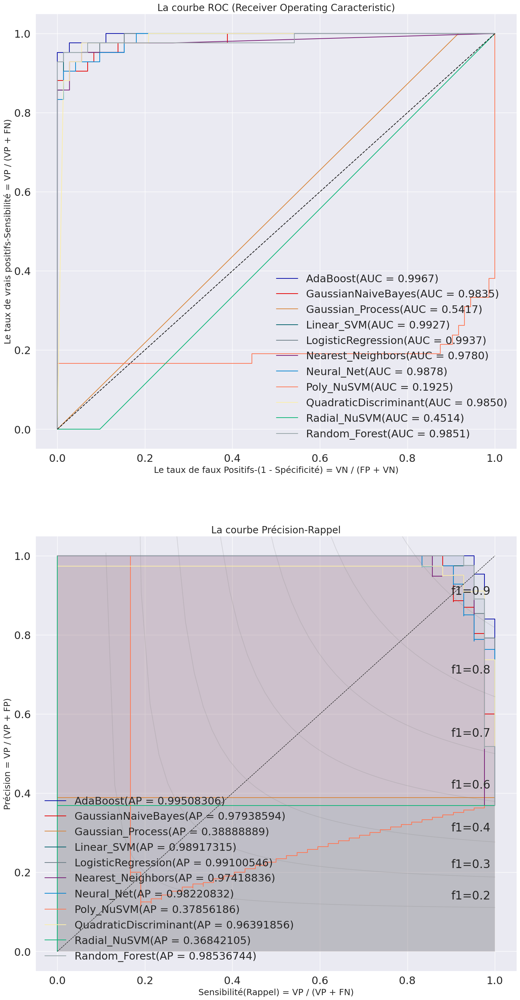

Exécution  :7.93s


In [19]:
resultats = executionEssaiComparaisonClassificateurs(classificateursDict, 
                                                     X_train, 
                                                     y_train,
                                                     X_test, 
                                                     y_test, 
                                                     couleurs = palette[:len(classificateursDict.keys())],
                                                     nom_essai = 'Initial', 
                                                     repertoireImages=repertoireImages)

AdaBoost          97.3684	--	Area under the ROC curve : 0.9967	--	

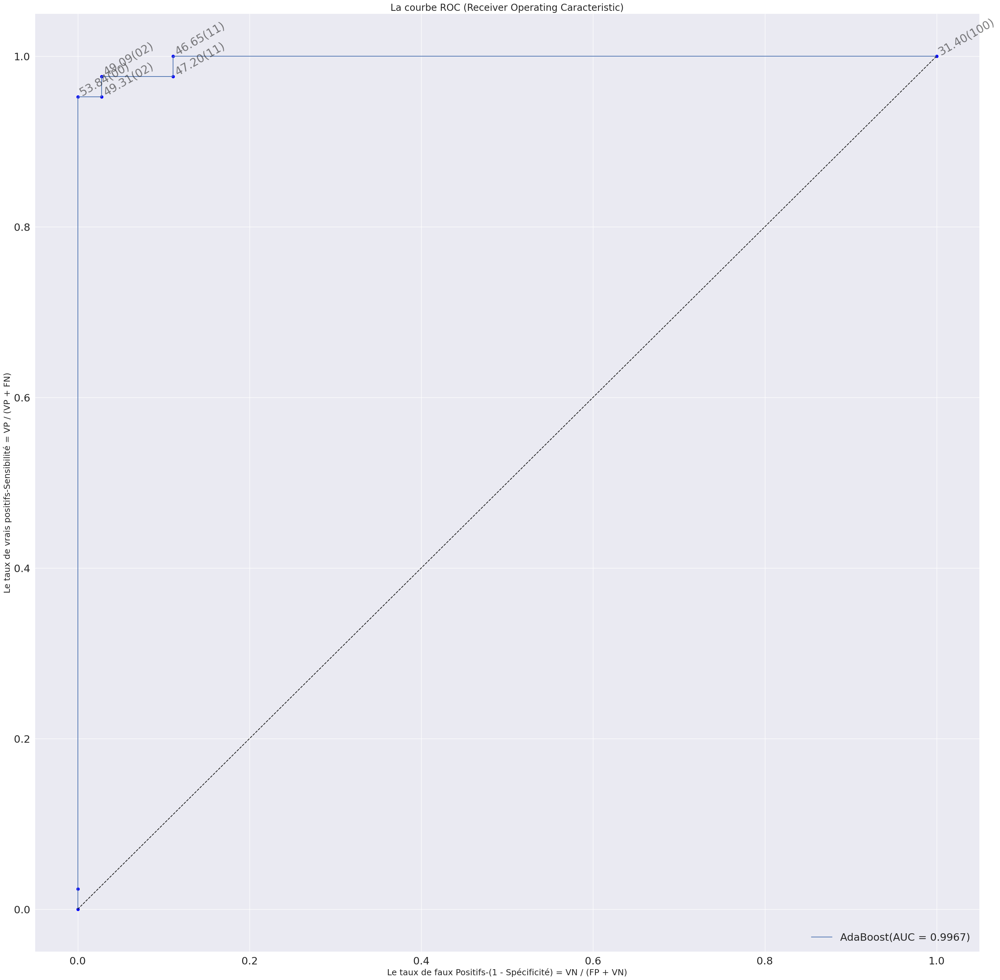

In [20]:
affichageROC('AdaBoost', classificateursDict['AdaBoost'], X_test, y_test)

In [21]:
resultats.drop(columns=['vrais_positifs', 'vrais_negatifs',
                         'faux_positifs', 'faux_negatifs']).sort_values('aucROC',ascending=False).head(10)

,aucROC,avgPrecRec,accuracy,f1,precision,sensibilite,specificite,logloss,hammingloss,jaccard,essai
Classifieur,,,,,,,,,,,
AdaBoost,0.996693,0.995083,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,Initial
LogisticRegression,0.993717,0.991005,0.956140,0.941176,0.930233,0.952381,0.958333,1.580862,0.043860,0.888889,Initial
Linear_SVM,0.992725,0.989173,0.956140,0.941176,0.930233,0.952381,0.958333,1.580862,0.043860,0.888889,Initial
Neural_Net,0.987765,0.982208,0.947368,0.926829,0.950000,0.904762,0.972222,1.897034,0.052632,0.863636,Initial
Random_Forest,0.985119,0.985367,0.938596,0.919540,0.888889,0.952381,0.930556,2.213207,0.061404,0.851064,Initial
QuadraticDiscriminant,0.984954,0.963919,0.956140,0.942529,0.911111,0.976190,0.944444,1.580862,0.043860,0.891304,Initial
GaussianNaiveBayes,0.983466,0.979386,0.921053,0.894118,0.883721,0.904762,0.930556,2.845552,0.078947,0.808511,Initial
Nearest_Neighbors,0.978009,0.974188,0.947368,0.926829,0.950000,0.904762,0.972222,1.897034,0.052632,0.863636,Initial
Gaussian_Process,0.541667,0.388889,0.710526,0.507463,0.680000,0.404762,0.888889,10.433689,0.289474,0.340000,Initial


# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Centrage et réduction des données</div></b> 

<table>
<tr>
<th><img src="https://raw.githubusercontent.com/rbizoi/IntelligenceEnDonneesDeSante/refs/heads/main/images/moyenne.png"></th>
<th><img src="https://raw.githubusercontent.com/rbizoi/IntelligenceEnDonneesDeSante/refs/heads/main/images/ecart_type.png"></th>
<th><img src="https://raw.githubusercontent.com/rbizoi/IntelligenceEnDonneesDeSante/refs/heads/main/images/centrage_reduction.png"></th>
</tr>
</table>

In [22]:
modelStd = StandardScaler()
modelStd.fit(X_train)

StandardScaler()

In [23]:
X_train[X_train.columns] = modelStd.transform(X_train)
X_test[X_test.columns] = modelStd.transform(X_test)

AdaBoost               0.9737	--	Area under the ROC curve : 0.9967	--	Exécution  :.21s
GaussianNaiveBayes     0.9035	--	Area under the ROC curve : 0.9792	--	Exécution  :.01s
Gaussian_Process       0.9386	--	Area under the ROC curve : 0.9458	--	Exécution  :.89s
Linear_SVM             0.9825	--	Area under the ROC curve : 0.9934	--	Exécution  :.05s
LogisticRegression     0.9737	--	Area under the ROC curve : 0.9931	--	Exécution  :.16s
Nearest_Neighbors      0.9386	--	Area under the ROC curve : 0.9868	--	Exécution  :.04s
Neural_Net             0.9561	--	Area under the ROC curve : 0.9921	--	Exécution  :.19s
Poly_NuSVM             0.9825	--	Area under the ROC curve : 0.9960	--	Exécution  :.03s
QuadraticDiscriminant  0.9561	--	Area under the ROC curve : 0.9850	--	Exécution  :.01s
Radial_NuSVM           0.8246	--	Area under the ROC curve : 0.9425	--	Exécution  :.07s
Random_Forest          0.9386	--	Area under the ROC curve : 0.9762	--	Exécution  :.23s


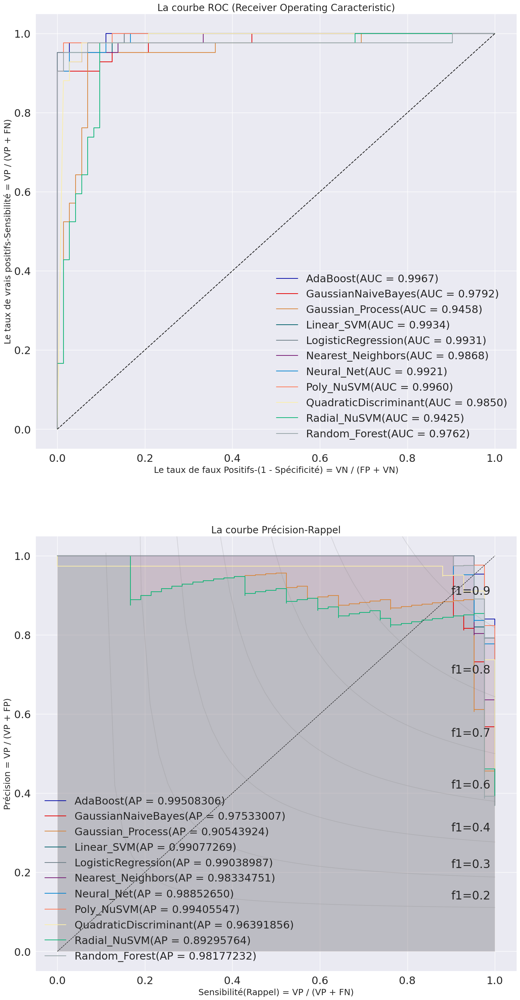

Exécution  :8.18s


In [24]:
resultatsTemp = executionEssaiComparaisonClassificateurs( classificateursDict, 
                                                        X_train, 
                                                        y_train, 
                                                        X_test, 
                                                        y_test, 
                                                        couleurs=palette[:len(classificateursDict.keys())],
                                                        nom_essai='StandardScaler', 
                                                        repertoireImages=repertoireImages)

AdaBoost          97.3684	--	Area under the ROC curve : 0.9967	--	

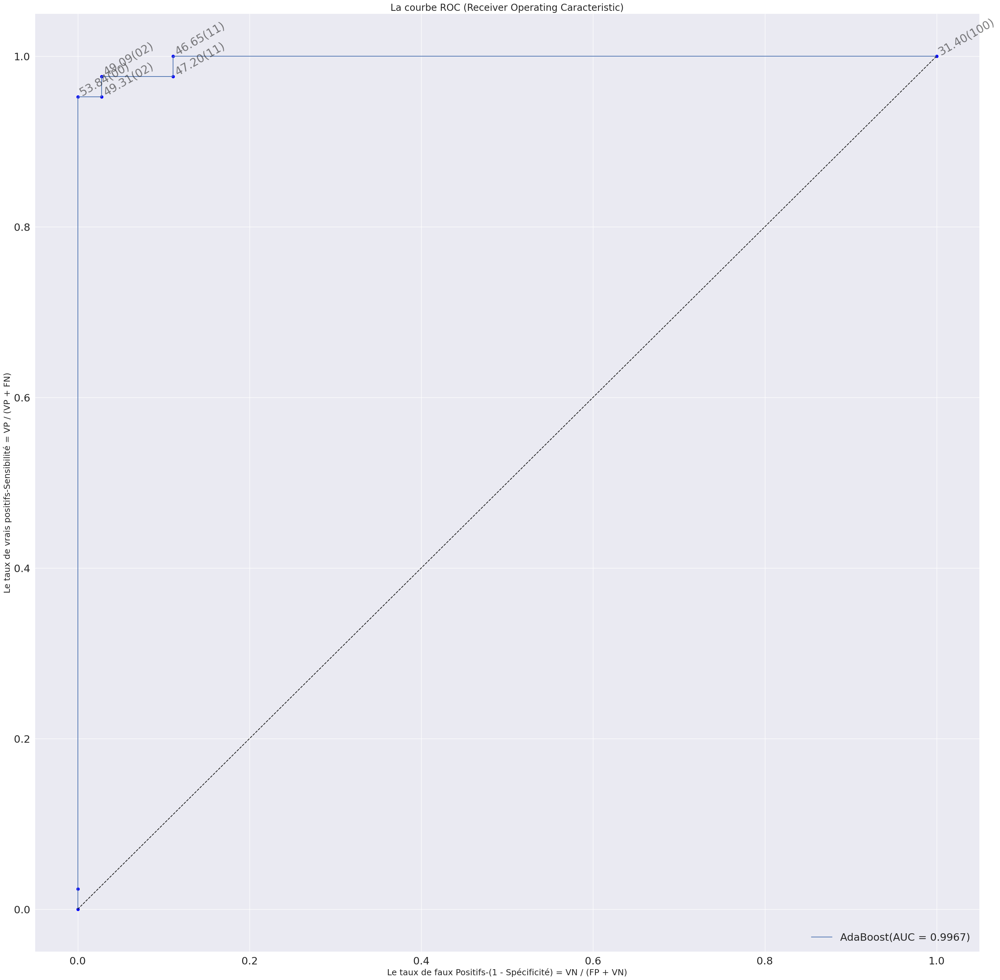

In [25]:
affichageROC('AdaBoost', classificateursDict['AdaBoost'], X_test, y_test)

In [26]:
resultats = pd.concat([resultats,resultatsTemp])

In [27]:
resultats.drop(columns=['vrais_positifs', 'vrais_negatifs',
                         'faux_positifs', 'faux_negatifs']).sort_values('aucROC',ascending=False).head(10)

,aucROC,avgPrecRec,accuracy,f1,precision,sensibilite,specificite,logloss,hammingloss,jaccard,essai
Classifieur,,,,,,,,,,,
AdaBoost,0.996693,0.995083,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,Initial
AdaBoost,0.996693,0.995083,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,StandardScaler
Poly_NuSVM,0.996032,0.994055,0.982456,0.976190,0.976190,0.976190,0.986111,0.632345,0.017544,0.953488,StandardScaler
LogisticRegression,0.993717,0.991005,0.956140,0.941176,0.930233,0.952381,0.958333,1.580862,0.043860,0.888889,Initial
Linear_SVM,0.993386,0.990773,0.982456,0.975610,1.000000,0.952381,1.000000,0.632345,0.017544,0.952381,StandardScaler
LogisticRegression,0.993056,0.990390,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,StandardScaler
Linear_SVM,0.992725,0.989173,0.956140,0.941176,0.930233,0.952381,0.958333,1.580862,0.043860,0.888889,Initial
Neural_Net,0.992063,0.988526,0.956140,0.941176,0.930233,0.952381,0.958333,1.580862,0.043860,0.888889,StandardScaler
Neural_Net,0.987765,0.982208,0.947368,0.926829,0.950000,0.904762,0.972222,1.897034,0.052632,0.863636,Initial


# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Choix simple de variables SE WORST</div></b> 

AdaBoost               0.9474	--	Area under the ROC curve : 0.9931	--	Exécution  :.17s
GaussianNaiveBayes     0.9211	--	Area under the ROC curve : 0.9798	--	Exécution  :.01s
Gaussian_Process       0.9561	--	Area under the ROC curve : 0.9613	--	Exécution  :.18s
Linear_SVM             0.9737	--	Area under the ROC curve : 0.9944	--	Exécution  :.07s
LogisticRegression     0.9737	--	Area under the ROC curve : 0.9937	--	Exécution  :.16s
Nearest_Neighbors      0.9561	--	Area under the ROC curve : 0.9798	--	Exécution  :.04s
Neural_Net             0.9649	--	Area under the ROC curve : 0.9934	--	Exécution  :.20s
Poly_NuSVM             0.9737	--	Area under the ROC curve : 0.9957	--	Exécution  :.03s
QuadraticDiscriminant  0.9474	--	Area under the ROC curve : 0.9833	--	Exécution  :.01s
Radial_NuSVM           0.8947	--	Area under the ROC curve : 0.9583	--	Exécution  :.07s
Random_Forest          0.9211	--	Area under the ROC curve : 0.9818	--	Exécution  :.13s


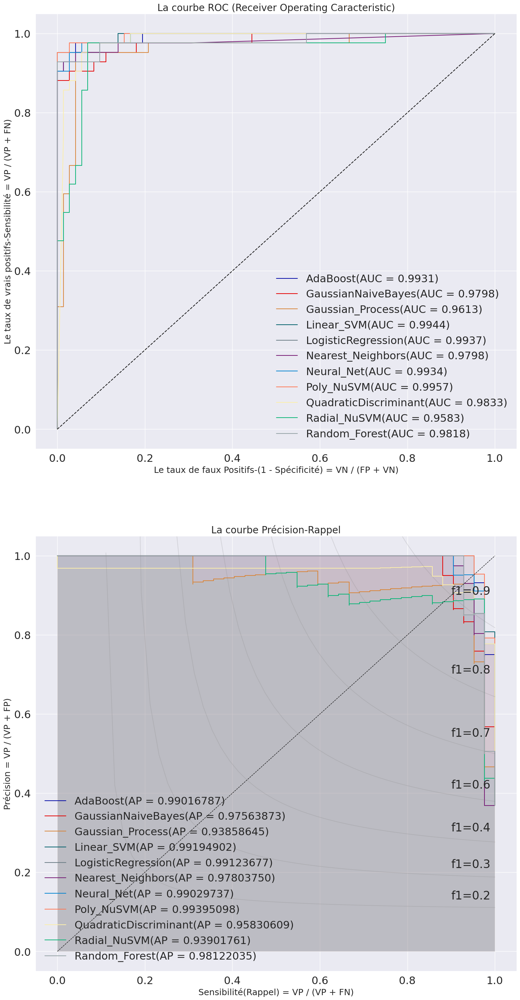

Exécution  :7.37s


In [28]:
resultatsTemp = executionEssaiComparaisonClassificateurs( classificateursDict=classificateursDict, 
                                                        X_train=X_train.filter(regex='(se|worst)$', axis=1), 
                                                        y_train=y_train,
                                                        X_test=X_test.filter(regex='(se|worst)$', axis=1), 
                                                        y_test=y_test, 
                                                        couleurs=palette[:len(classificateursDict.keys())],
                                                        nom_essai='ChoixVarSE+W',
                                                        repertoireImages=repertoireImages)

Linear_SVM        97.3684	--	Area under the ROC curve : 0.9944	--	

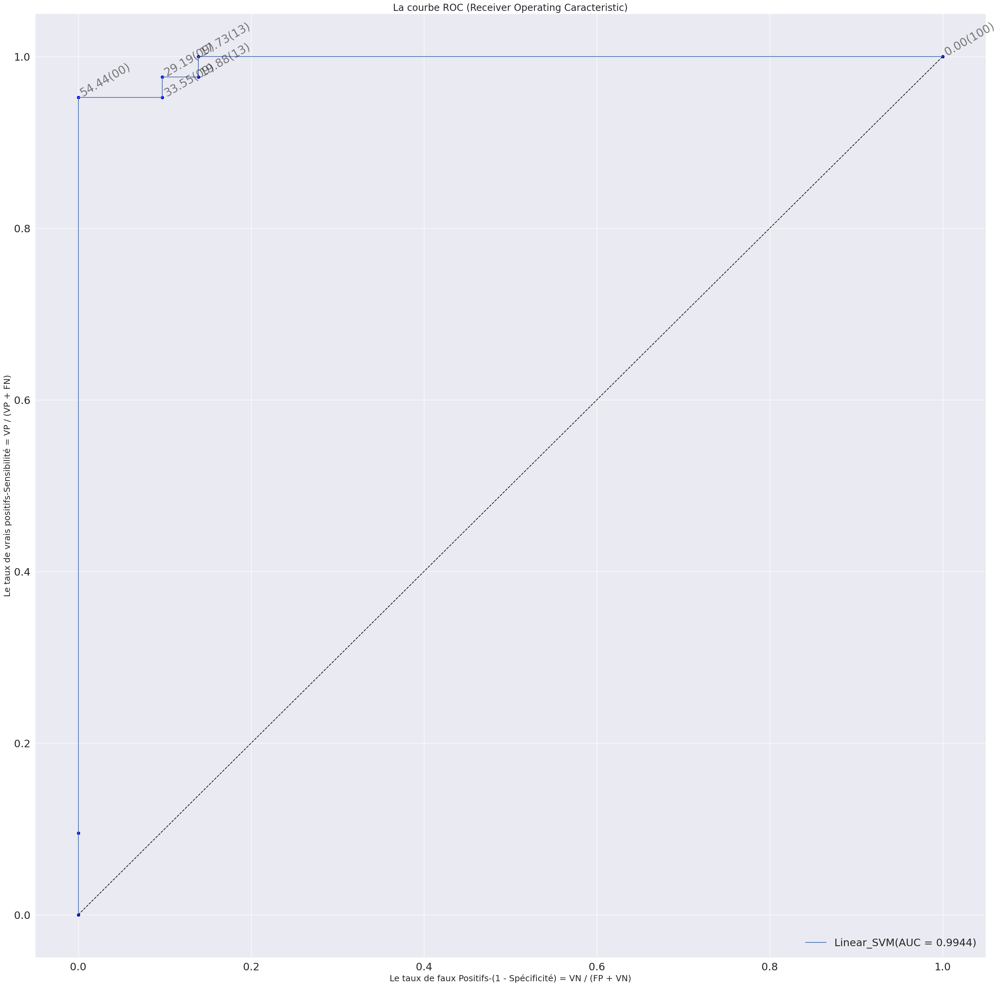

In [29]:
affichageROC('Linear_SVM', classificateursDict['Linear_SVM'], X_test.filter(regex='(se|worst)$', axis=1), y_test)

In [30]:
resultats = pd.concat([resultats,resultatsTemp])

In [31]:
resultats.drop(columns=['vrais_positifs', 'vrais_negatifs',
                         'faux_positifs', 'faux_negatifs']).sort_values('aucROC',ascending=False).head(10)

,aucROC,avgPrecRec,accuracy,f1,precision,sensibilite,specificite,logloss,hammingloss,jaccard,essai
Classifieur,,,,,,,,,,,
AdaBoost,0.996693,0.995083,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,Initial
AdaBoost,0.996693,0.995083,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,StandardScaler
Poly_NuSVM,0.996032,0.994055,0.982456,0.976190,0.976190,0.976190,0.986111,0.632345,0.017544,0.953488,StandardScaler
Poly_NuSVM,0.995701,0.993951,0.973684,0.964706,0.953488,0.976190,0.972222,0.948517,0.026316,0.931818,ChoixVarSE+W
Linear_SVM,0.994378,0.991949,0.973684,0.962963,1.000000,0.928571,1.000000,0.948517,0.026316,0.928571,ChoixVarSE+W
LogisticRegression,0.993717,0.991005,0.956140,0.941176,0.930233,0.952381,0.958333,1.580862,0.043860,0.888889,Initial
LogisticRegression,0.993717,0.991237,0.973684,0.962963,1.000000,0.928571,1.000000,0.948517,0.026316,0.928571,ChoixVarSE+W
Neural_Net,0.993386,0.990297,0.964912,0.952381,0.952381,0.952381,0.972222,1.264690,0.035088,0.909091,ChoixVarSE+W
Linear_SVM,0.993386,0.990773,0.982456,0.975610,1.000000,0.952381,1.000000,0.632345,0.017544,0.952381,StandardScaler


# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Choix simple de variables WORST</div></b> 

AdaBoost               0.9825	--	Area under the ROC curve : 0.9960	--	Exécution  :.13s
GaussianNaiveBayes     0.9211	--	Area under the ROC curve : 0.9808	--	Exécution  :.01s
Gaussian_Process       0.9386	--	Area under the ROC curve : 0.9759	--	Exécution  :.19s
Linear_SVM             0.9474	--	Area under the ROC curve : 0.9937	--	Exécution  :.02s
LogisticRegression     0.9474	--	Area under the ROC curve : 0.9947	--	Exécution  :.20s
Nearest_Neighbors      0.9474	--	Area under the ROC curve : 0.9815	--	Exécution  :.04s
Neural_Net             0.9474	--	Area under the ROC curve : 0.9944	--	Exécution  :.18s
Poly_NuSVM             0.9298	--	Area under the ROC curve : 0.9868	--	Exécution  :.03s
QuadraticDiscriminant  0.9474	--	Area under the ROC curve : 0.9833	--	Exécution  :.01s
Radial_NuSVM           0.9211	--	Area under the ROC curve : 0.9798	--	Exécution  :.05s
Random_Forest          0.9474	--	Area under the ROC curve : 0.9831	--	Exécution  :.16s


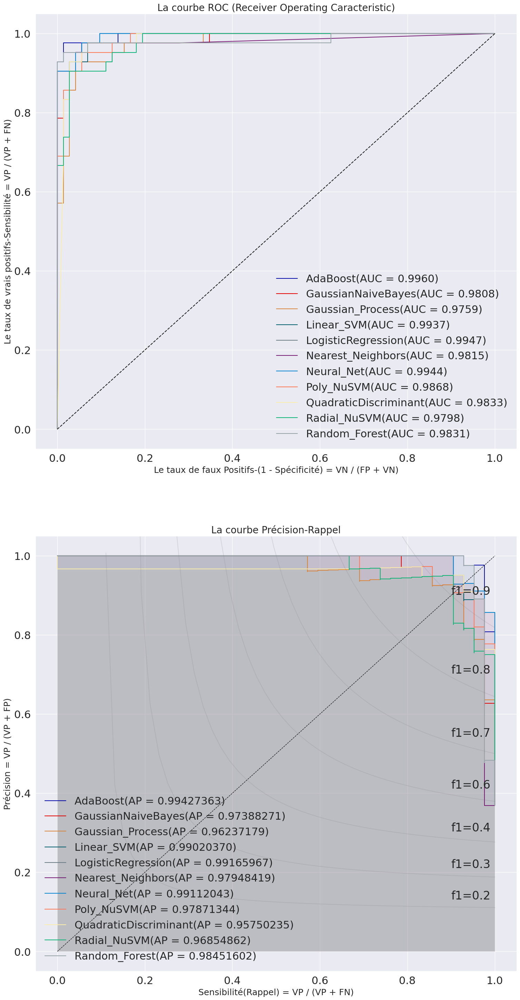

Exécution  :7.40s


In [32]:
resultatsTemp = executionEssaiComparaisonClassificateurs( classificateursDict=classificateursDict, 
                                                        X_train=X_train.filter(regex='(worst)$', axis=1), 
                                                        y_train=y_train,
                                                        X_test=X_test.filter(regex='(worst)$', axis=1), 
                                                        y_test=y_test, 
                                                        couleurs=palette[:len(classificateursDict.keys())],
                                                        nom_essai='ChoixVarW',
                                                        repertoireImages=repertoireImages)

Neural_Net        94.7368	--	Area under the ROC curve : 0.9944	--	

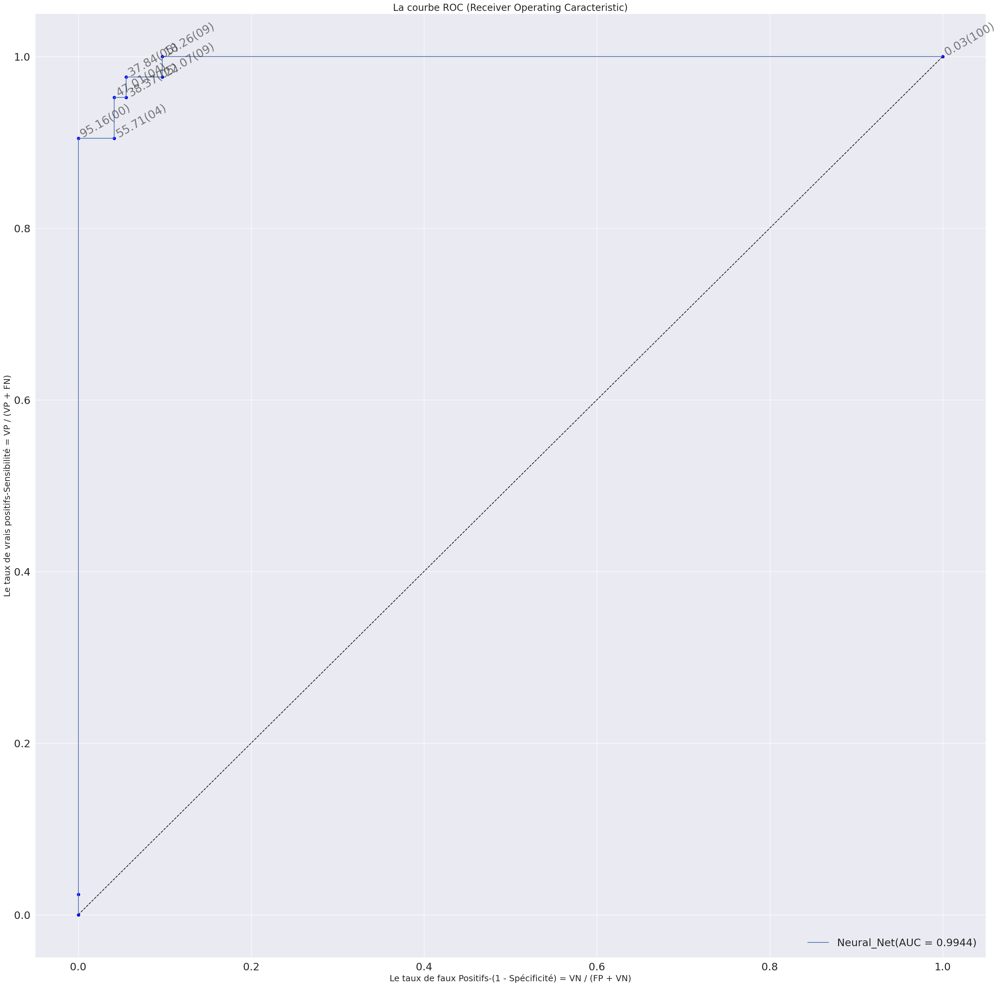

In [33]:
affichageROC('Neural_Net', classificateursDict['Neural_Net'], X_test.filter(regex='(worst)$', axis=1), y_test)

In [34]:
resultats = pd.concat([resultats,resultatsTemp])

In [35]:
resultats.drop(columns=['vrais_positifs', 'vrais_negatifs',
                         'faux_positifs', 'faux_negatifs']).sort_values('aucROC',ascending=False).head(10)

,aucROC,avgPrecRec,accuracy,f1,precision,sensibilite,specificite,logloss,hammingloss,jaccard,essai
Classifieur,,,,,,,,,,,
AdaBoost,0.996693,0.995083,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,Initial
AdaBoost,0.996693,0.995083,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,StandardScaler
Poly_NuSVM,0.996032,0.994055,0.982456,0.976190,0.976190,0.976190,0.986111,0.632345,0.017544,0.953488,StandardScaler
AdaBoost,0.996032,0.994274,0.982456,0.976190,0.976190,0.976190,0.986111,0.632345,0.017544,0.953488,ChoixVarW
Poly_NuSVM,0.995701,0.993951,0.973684,0.964706,0.953488,0.976190,0.972222,0.948517,0.026316,0.931818,ChoixVarSE+W
LogisticRegression,0.994709,0.991660,0.947368,0.928571,0.928571,0.928571,0.958333,1.897034,0.052632,0.866667,ChoixVarW
Linear_SVM,0.994378,0.991949,0.973684,0.962963,1.000000,0.928571,1.000000,0.948517,0.026316,0.928571,ChoixVarSE+W
Neural_Net,0.994378,0.991120,0.947368,0.928571,0.928571,0.928571,0.958333,1.897034,0.052632,0.866667,ChoixVarW
Linear_SVM,0.993717,0.990204,0.947368,0.926829,0.950000,0.904762,0.972222,1.897034,0.052632,0.863636,ChoixVarW


# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Analyse en composantes principales</div></b> 

nombre des dimensions = 10


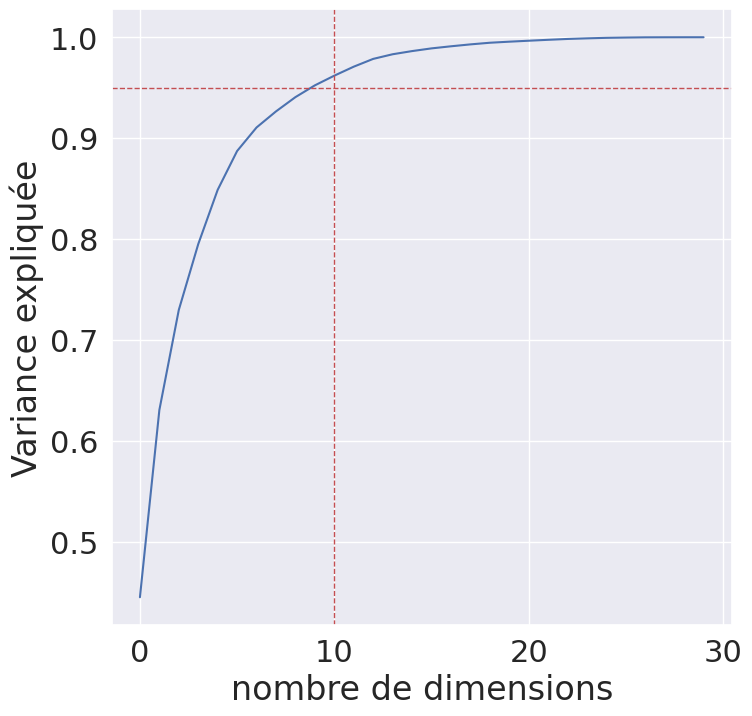

In [36]:
modelACP = PCA().fit(X_train)
plt.figure(figsize=(8,8))
plt.plot(np.cumsum(modelACP.explained_variance_ratio_))
nombreDim = sum(modelACP.explained_variance_ratio_.cumsum() < .95) + 1
plt.axvline(nombreDim, 0, 1, linewidth=1, ls='--', color='r');
plt.axhline(0.95, 0, 1, linewidth=1, ls='--', color='r');
plt.xlabel('nombre de dimensions')
plt.ylabel('Variance expliquée');
print(f'nombre des dimensions = {nombreDim}')

In [37]:
modelACP = PCA(nombreDim).fit(X_train)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((455, 30), (114, 30), (455,), (114,))

In [38]:
X_train, X_test = modelACP.transform(X_train),modelACP.transform(X_test)

AdaBoost               0.9561	--	Area under the ROC curve : 0.9914	--	Exécution  :.13s
GaussianNaiveBayes     0.9035	--	Area under the ROC curve : 0.9699	--	Exécution  :.01s
Gaussian_Process       0.9386	--	Area under the ROC curve : 0.9494	--	Exécution  :.24s
Linear_SVM             0.9737	--	Area under the ROC curve : 0.9931	--	Exécution  :.02s
LogisticRegression     0.9474	--	Area under the ROC curve : 0.9924	--	Exécution  :.18s
Nearest_Neighbors      0.9474	--	Area under the ROC curve : 0.9868	--	Exécution  :.03s
Neural_Net             0.9561	--	Area under the ROC curve : 0.9927	--	Exécution  :.19s
Poly_NuSVM             0.9737	--	Area under the ROC curve : 0.9940	--	Exécution  :.02s
QuadraticDiscriminant  0.9561	--	Area under the ROC curve : 0.9878	--	Exécution  :.01s
Radial_NuSVM           0.9123	--	Area under the ROC curve : 0.9464	--	Exécution  :.07s
Random_Forest          0.9123	--	Area under the ROC curve : 0.9623	--	Exécution  :.14s


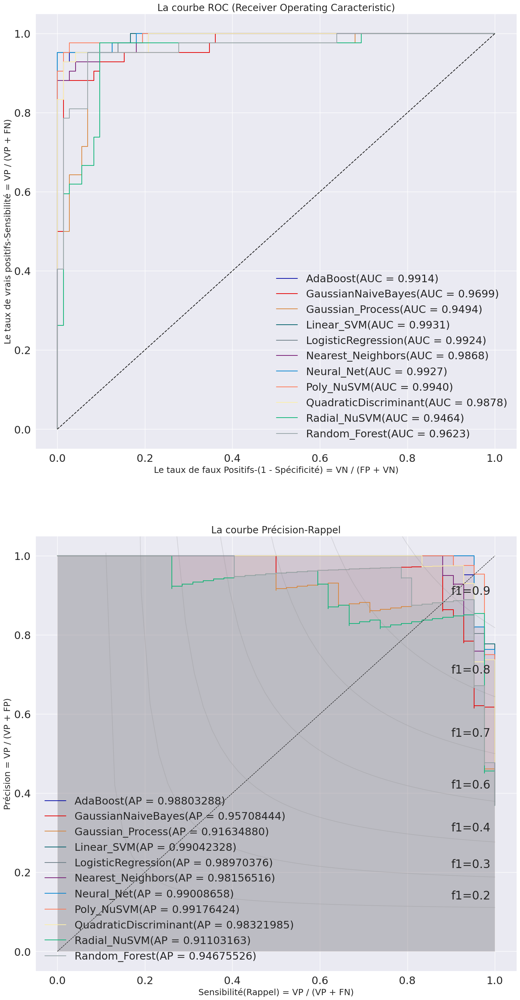

Exécution  :7.30s


In [39]:
resultatsTemp = executionEssaiComparaisonClassificateurs( classificateursDict=classificateursDict, 
                                                        X_train=X_train, 
                                                        y_train=y_train,
                                                        X_test=X_test, 
                                                        y_test=y_test, 
                                                        couleurs=palette[:len(classificateursDict.keys())],
                                                        nom_essai='TransformationACP',
                                                        repertoireImages=repertoireImages)

Linear_SVM        97.3684	--	Area under the ROC curve : 0.9931	--	

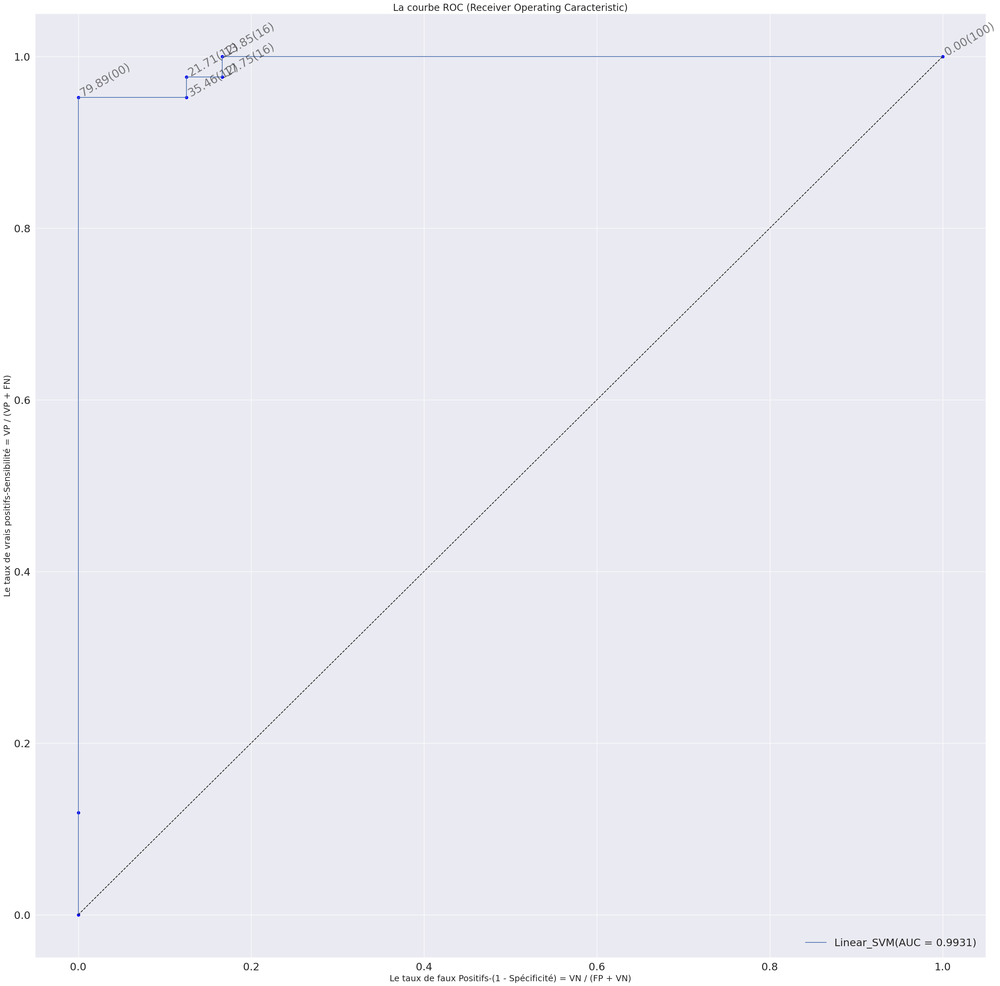

In [40]:
affichageROC('Linear_SVM', classificateursDict['Linear_SVM'], X_test, y_test)

In [41]:
resultats = pd.concat([resultats,resultatsTemp])

In [42]:
resultats.drop(columns=['vrais_positifs', 'vrais_negatifs',
                         'faux_positifs', 'faux_negatifs']).sort_values('aucROC',ascending=False).head(10)

,aucROC,avgPrecRec,accuracy,f1,precision,sensibilite,specificite,logloss,hammingloss,jaccard,essai
Classifieur,,,,,,,,,,,
AdaBoost,0.996693,0.995083,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,Initial
AdaBoost,0.996693,0.995083,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,StandardScaler
Poly_NuSVM,0.996032,0.994055,0.982456,0.976190,0.976190,0.976190,0.986111,0.632345,0.017544,0.953488,StandardScaler
AdaBoost,0.996032,0.994274,0.982456,0.976190,0.976190,0.976190,0.986111,0.632345,0.017544,0.953488,ChoixVarW
Poly_NuSVM,0.995701,0.993951,0.973684,0.964706,0.953488,0.976190,0.972222,0.948517,0.026316,0.931818,ChoixVarSE+W
LogisticRegression,0.994709,0.991660,0.947368,0.928571,0.928571,0.928571,0.958333,1.897034,0.052632,0.866667,ChoixVarW
Linear_SVM,0.994378,0.991949,0.973684,0.962963,1.000000,0.928571,1.000000,0.948517,0.026316,0.928571,ChoixVarSE+W
Neural_Net,0.994378,0.991120,0.947368,0.928571,0.928571,0.928571,0.958333,1.897034,0.052632,0.866667,ChoixVarW
Poly_NuSVM,0.994048,0.991764,0.973684,0.964706,0.953488,0.976190,0.972222,0.948517,0.026316,0.931818,TransformationACP


# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Discrétisation quantile 100</div></b> 

In [43]:
donnees_ft = donnees.copy()
for colonne in  ['area_worst', 'compactness_worst', 
                'fractal_dimension_worst', 'perimeter_worst',
                'radius_worst', 'smoothness_worst', 'symmetry_worst', 'texture_worst'] :
    donnees_ft[f'{colonne}Q100'] = pd.qcut(donnees_ft[colonne],100,labels=False)    

In [44]:
donnees_ft.filter(regex='Q100$', axis=1).columns

Index(['area_worstQ100', 'compactness_worstQ100',
       'fractal_dimension_worstQ100', 'perimeter_worstQ100',
       'radius_worstQ100', 'smoothness_worstQ100', 'symmetry_worstQ100',
       'texture_worstQ100'],
      dtype='object')

In [45]:
X_train, X_test = \
                  donnees_ft.loc[donnees_ft['échantillon']=='apprentissage',donnees_ft.filter(regex='Q100$', axis=1).columns],\
                  donnees_ft.loc[donnees_ft['échantillon']=='test',donnees_ft.filter(regex='Q100$', axis=1).columns]

y_train, y_test = \
                  donnees_ft.loc[donnees_ft['échantillon']=='apprentissage',cible].apply(lambda x: dictDiagnosis[x]),\
                  donnees_ft.loc[donnees_ft['échantillon']=='test',cible].apply(lambda x: dictDiagnosis[x])

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((455, 8), (114, 8), (455,), (114,))

AdaBoost               0.9211	--	Area under the ROC curve : 0.9871	--	Exécution  :.10s
GaussianNaiveBayes     0.9211	--	Area under the ROC curve : 0.9878	--	Exécution  :.01s
Gaussian_Process       0.8596	--	Area under the ROC curve : 0.5000	--	Exécution  :.15s
Linear_SVM             0.9561	--	Area under the ROC curve : 0.9950	--	Exécution  :.10s
LogisticRegression     0.9649	--	Area under the ROC curve : 0.9967	--	Exécution  :.16s
Nearest_Neighbors      0.9474	--	Area under the ROC curve : 0.9894	--	Exécution  :.04s
Neural_Net             0.8509	--	Area under the ROC curve : 0.9507	--	Exécution  :.18s
Poly_NuSVM             0.9561	--	Area under the ROC curve : 0.9954	--	Exécution  :.02s
QuadraticDiscriminant  0.9035	--	Area under the ROC curve : 0.9679	--	Exécution  :.01s
Radial_NuSVM           0.6316	--	Area under the ROC curve : 0.5000	--	Exécution  :.07s
Random_Forest          0.9737	--	Area under the ROC curve : 0.9821	--	Exécution  :.13s


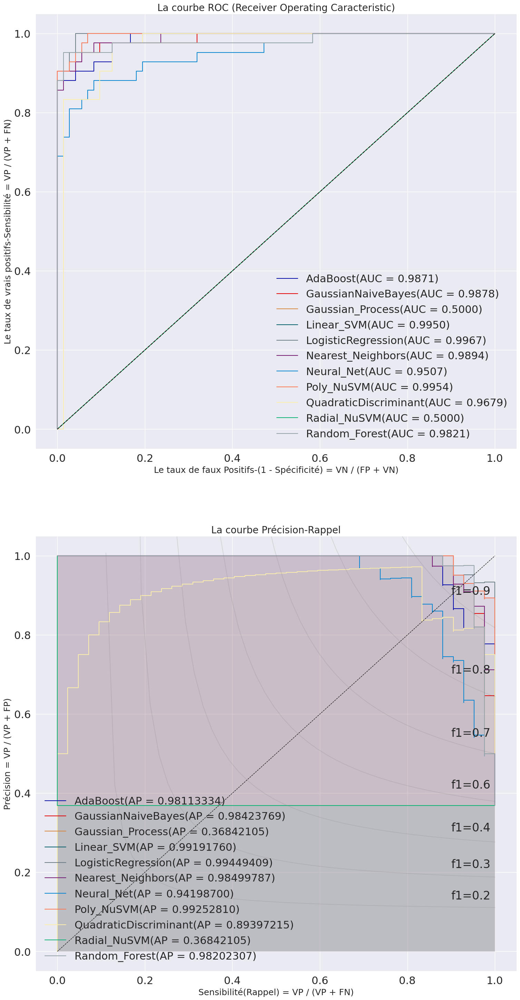

Exécution  :7.02s


In [46]:
resultatsTemp = executionEssaiComparaisonClassificateurs( classificateursDict=classificateursDict, 
                                                        X_train=X_train, 
                                                        y_train=y_train,
                                                        X_test=X_test, 
                                                        y_test=y_test, 
                                                        couleurs=palette[:len(classificateursDict.keys())],
                                                        nom_essai='VariableQ100',
                                                        repertoireImages=repertoireImages)

LogisticRegression 96.4912	--	Area under the ROC curve : 0.9967	--	

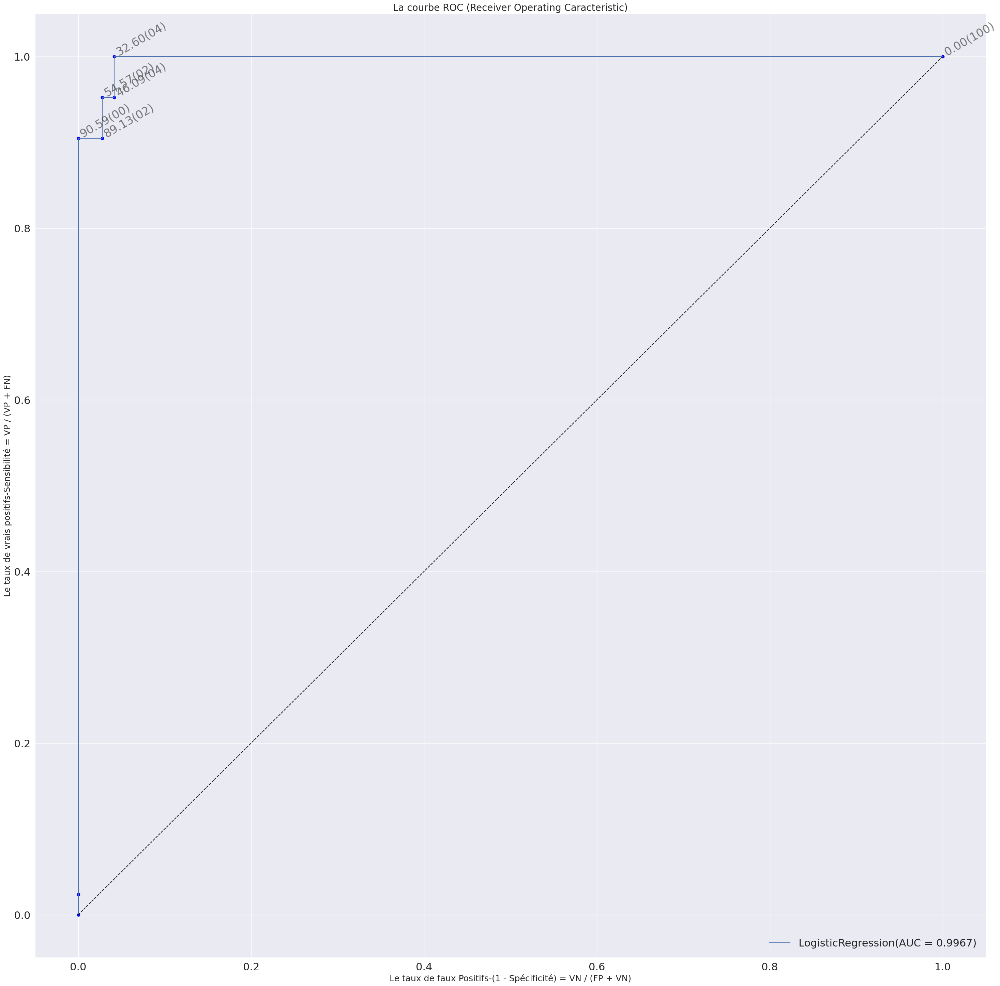

In [47]:
affichageROC('LogisticRegression', classificateursDict['LogisticRegression'], X_test, y_test)

In [48]:
resultats = pd.concat([resultats,resultatsTemp])

In [49]:
resultats.drop(columns=['vrais_positifs', 'vrais_negatifs',
                         'faux_positifs', 'faux_negatifs']).sort_values('aucROC',ascending=False).head(10)

,aucROC,avgPrecRec,accuracy,f1,precision,sensibilite,specificite,logloss,hammingloss,jaccard,essai
Classifieur,,,,,,,,,,,
LogisticRegression,0.996693,0.994494,0.964912,0.952381,0.952381,0.952381,0.972222,1.264690,0.035088,0.909091,VariableQ100
AdaBoost,0.996693,0.995083,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,Initial
AdaBoost,0.996693,0.995083,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,StandardScaler
Poly_NuSVM,0.996032,0.994055,0.982456,0.976190,0.976190,0.976190,0.986111,0.632345,0.017544,0.953488,StandardScaler
AdaBoost,0.996032,0.994274,0.982456,0.976190,0.976190,0.976190,0.986111,0.632345,0.017544,0.953488,ChoixVarW
Poly_NuSVM,0.995701,0.993951,0.973684,0.964706,0.953488,0.976190,0.972222,0.948517,0.026316,0.931818,ChoixVarSE+W
Poly_NuSVM,0.995370,0.992528,0.956140,0.939759,0.951220,0.928571,0.972222,1.580862,0.043860,0.886364,VariableQ100
Linear_SVM,0.995040,0.991918,0.956140,0.939759,0.951220,0.928571,0.972222,1.580862,0.043860,0.886364,VariableQ100
LogisticRegression,0.994709,0.991660,0.947368,0.928571,0.928571,0.928571,0.958333,1.897034,0.052632,0.866667,ChoixVarW


In [50]:
resultats.drop(columns=['vrais_positifs', 'vrais_negatifs',
                         'faux_positifs', 'faux_negatifs']).sort_values('f1',ascending=False).head(10)

,aucROC,avgPrecRec,accuracy,f1,precision,sensibilite,specificite,logloss,hammingloss,jaccard,essai
Classifieur,,,,,,,,,,,
AdaBoost,0.996032,0.994274,0.982456,0.976190,0.976190,0.976190,0.986111,0.632345,0.017544,0.953488,ChoixVarW
Poly_NuSVM,0.996032,0.994055,0.982456,0.976190,0.976190,0.976190,0.986111,0.632345,0.017544,0.953488,StandardScaler
Linear_SVM,0.993386,0.990773,0.982456,0.975610,1.000000,0.952381,1.000000,0.632345,0.017544,0.952381,StandardScaler
Poly_NuSVM,0.994048,0.991764,0.973684,0.964706,0.953488,0.976190,0.972222,0.948517,0.026316,0.931818,TransformationACP
Poly_NuSVM,0.995701,0.993951,0.973684,0.964706,0.953488,0.976190,0.972222,0.948517,0.026316,0.931818,ChoixVarSE+W
Random_Forest,0.982143,0.982023,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,VariableQ100
Linear_SVM,0.993056,0.990423,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,TransformationACP
LogisticRegression,0.993056,0.990390,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,StandardScaler
AdaBoost,0.996693,0.995083,0.973684,0.963855,0.975610,0.952381,0.986111,0.948517,0.026316,0.930233,StandardScaler


# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Affichage des évolutions des métriques dans les essais</div></b> 

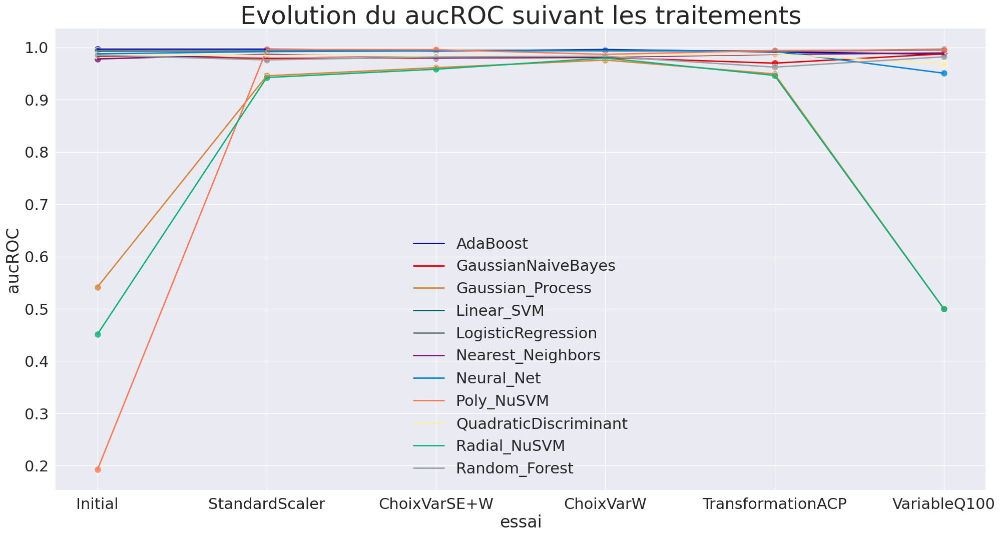

In [51]:
affichageEvolutionMetriques(resultats, metrique='aucROC', palette=palette)

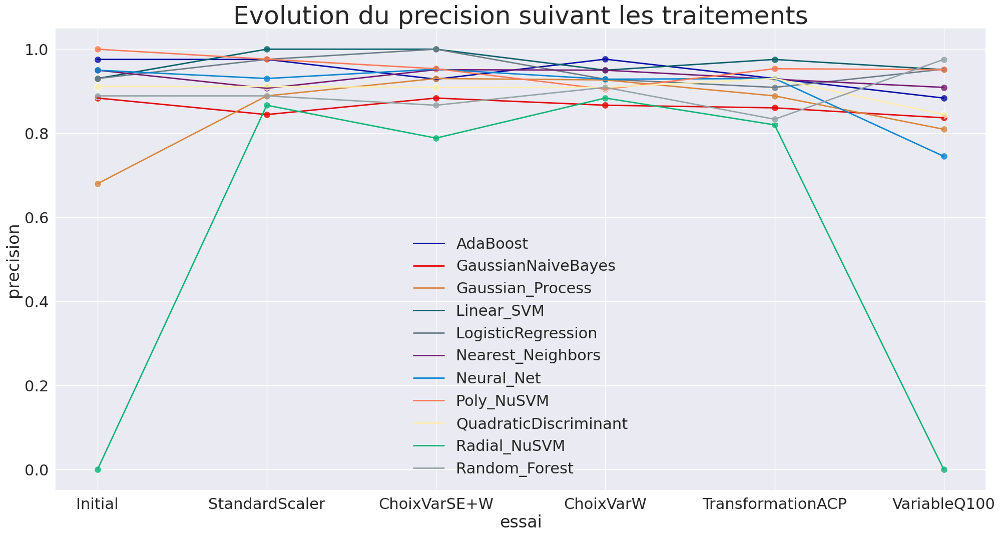

In [52]:
affichageEvolutionMetriques(resultats, metrique='precision', palette=palette)

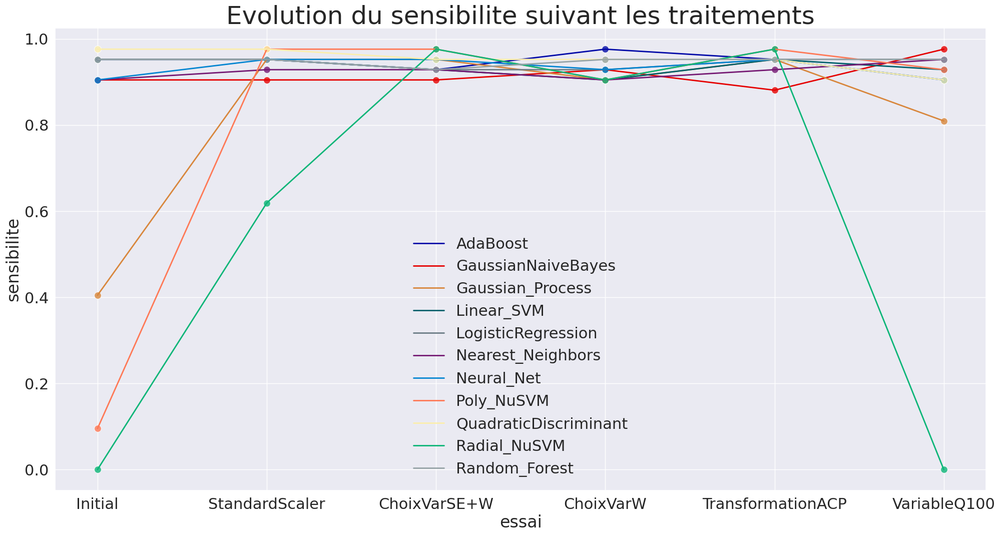

In [53]:
affichageEvolutionMetriques(resultats, metrique='sensibilite', palette=palette)

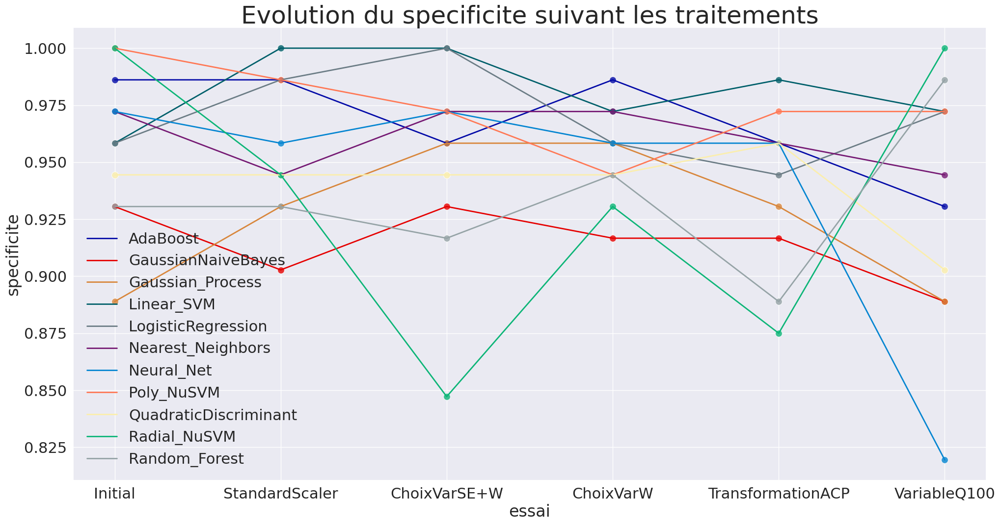

In [54]:
affichageEvolutionMetriques(resultats, metrique='specificite', palette=palette)

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Optimisation des classificateurs</div></b> 

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>LogisticRegression - VariableQ100</div></b> 

In [55]:
X = donnees_ft.loc[:,donnees_ft.filter(regex='Q100$', axis=1).columns]
y = donnees_ft.loc[:,cible].apply(lambda x: dictDiagnosis[x])

nom = 'LogisticRegression'

cv_sets = ShuffleSplit(random_state=101)

# param_grid={
#       'C'                    : np.logspace(-10,10,10), 
#       'penalty'               : ['l1','l2']#,# l1 lasso l2 ridge
#      # 'solver'                : ['lbfgs', 'liblinear', 'sag', 'saga']
#      }

param_grid=[
                {
                    'C'       : np.logspace(-1, 2, 20),
                    'penalty' : ['l2'],
                    'solver'  : ['lbfgs', 'newton-cg', 'sag', 'saga']
                },
                {
                    'C'       : np.logspace(-1, 2, 20),
                    'penalty' : ['l1'],
                    'solver'  : ['liblinear', 'saga']
                },
            ]



scoring = make_scorer(f1_score)

classifieur = LogisticRegression(max_iter=3000, n_jobs=-1)

gridCV = GridSearchCV( 
                         estimator=classifieur,
                         param_grid = param_grid, 
                         scoring=scoring,  
                         cv=cv_sets,  
                         refit='AUC', 
                         return_train_score=True
                      )

t0 = time.time()
gridCV.fit(X,y)

print("Les paramètres optimaux %s avec un score de %.8f" % ( gridCV.best_params_, gridCV.best_score_))
print('Exécution  :'+('%.2fs' % (time.time() - t0)).lstrip('0'))
classificateursDict[nom] = gridCV.best_estimator_

Les paramètres optimaux {'C': 0.29763514416313175, 'penalty': 'l1', 'solver': 'liblinear'} avec un score de 0.95273334
Exécution  :72.09s


## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Random_Forest - VariableQ100</div></b> 

In [56]:
nom = 'Random_Forest'

cv_sets = ShuffleSplit(random_state=101)

param_grid = {
              "n_estimators"      : [10,25,50,75,100],
              "max_features"      : [1,5,10,20],
              "min_samples_split" : [2,4,8],
              "max_depth"         : [3,6,9,12],
              "criterion"         : ["gini"]
             }

scoring = make_scorer(f1_score)

classifieur = RandomForestClassifier(n_jobs=-1)

gridCV = GridSearchCV(
                      estimator=classifieur,
                      param_grid=param_grid,
                      scoring=scoring, 
                      cv=cv_sets, 
                      refit='AUC', 
                      return_train_score=True,
                      n_jobs=-1
                     )

gridCV.fit(X,y)

print("Les paramètres optimaux %s avec un score de %.8f" % (gridCV.best_params_, gridCV.best_score_))
print('Exécution  :'+('%.2fs' % (time.time() - t0)).lstrip('0'))
classificateursDict[nom] = gridCV.best_estimator_

Les paramètres optimaux {'criterion': 'gini', 'max_depth': 12, 'max_features': 1, 'min_samples_split': 4, 'n_estimators': 50} avec un score de 0.95925030
Exécution  :83.47s


## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Linear_SVM - StandardScaler</div></b> 

In [57]:
nom = 'Linear_SVM'
donnees = pd.read_parquet(os.path.join(repertoireDonnees,'donnees_echantillons.parquet'))
X = donnees.loc[:,donnees.drop(columns=[cible,'échantillon']).columns]
y = donnees.loc[:,cible].apply(lambda x: dictDiagnosis[x])
X[X.columns] = modelStd.transform(X)

cv_sets = ShuffleSplit(random_state=101)

C_range = 10. ** np.arange(-5, 1)

param_grid={
            'C'        : C_range,
            }

scoring = make_scorer(f1_score)

classifieur = SVC(kernel="linear", probability=True)

gridCV = GridSearchCV(estimator=classifieur,
                      param_grid=param_grid,
                      scoring=scoring, 
                      cv=cv_sets, 
                      refit='AUC', 
                      return_train_score=True)

t0 = time.time()
gridCV.fit(X,y)

print("Les paramètres optimaux %s avec un score de %.8f" % (gridCV.best_params_, gridCV.best_score_))
print('Exécution  :'+('%.2fs' % (time.time() - t0)).lstrip('0'))
classificateursDict[nom] = gridCV.best_estimator_

Les paramètres optimaux {'C': 0.1} avec un score de 0.97871864
Exécution  :1.93s


# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Validation Croisée</div></b>

<img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/validationCroisee.png" width="800">

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>LogisticRegression - VariableQ100</div></b>

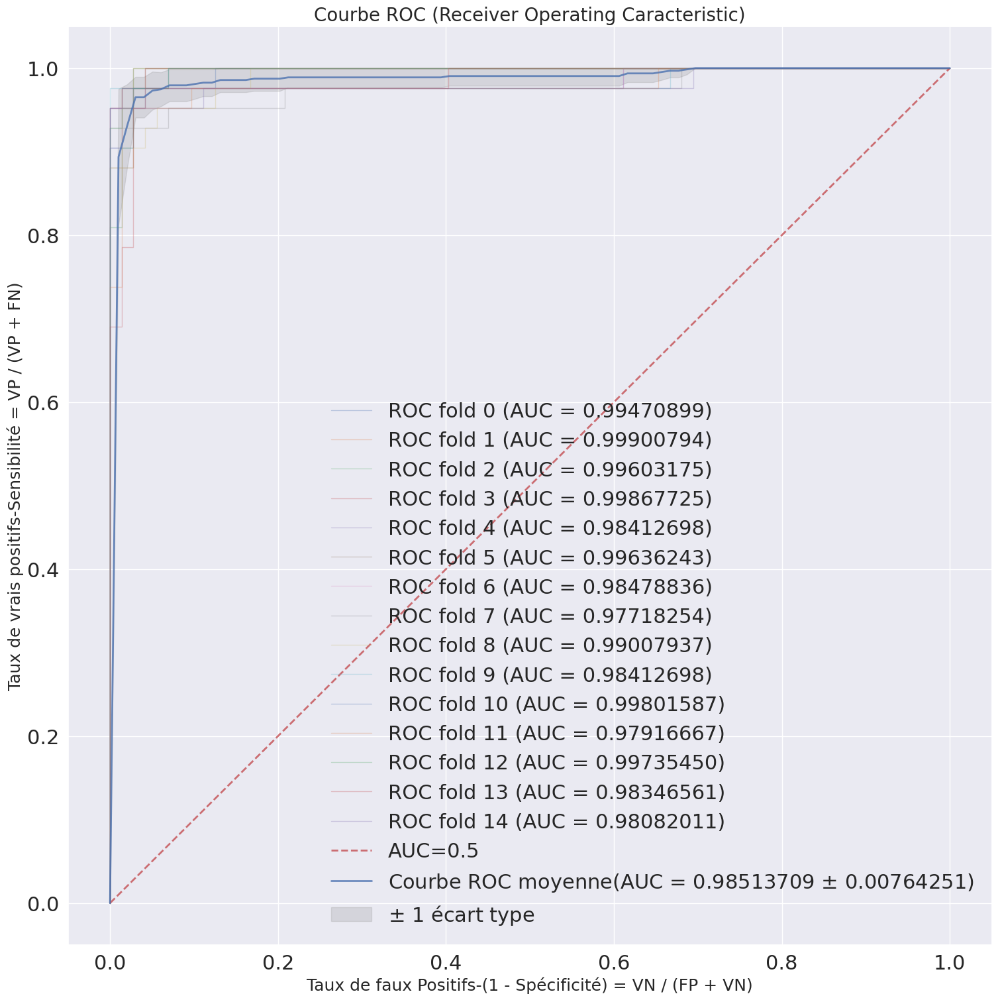

In [58]:
classificateurs = executeValidationCroisee(X = donnees_ft.loc[:,donnees_ft.filter(regex='Q100$', axis=1).columns].values, 
                                           y = donnees_ft.loc[:,cible].apply(lambda x: dictDiagnosis[x]).values, 
                                           classificateur=classificateursDict['LogisticRegression'],
                                           validation=StratifiedShuffleSplit(n_splits=15, test_size=0.2, random_state=0))

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Random_Forest - VariableQ100</div></b>

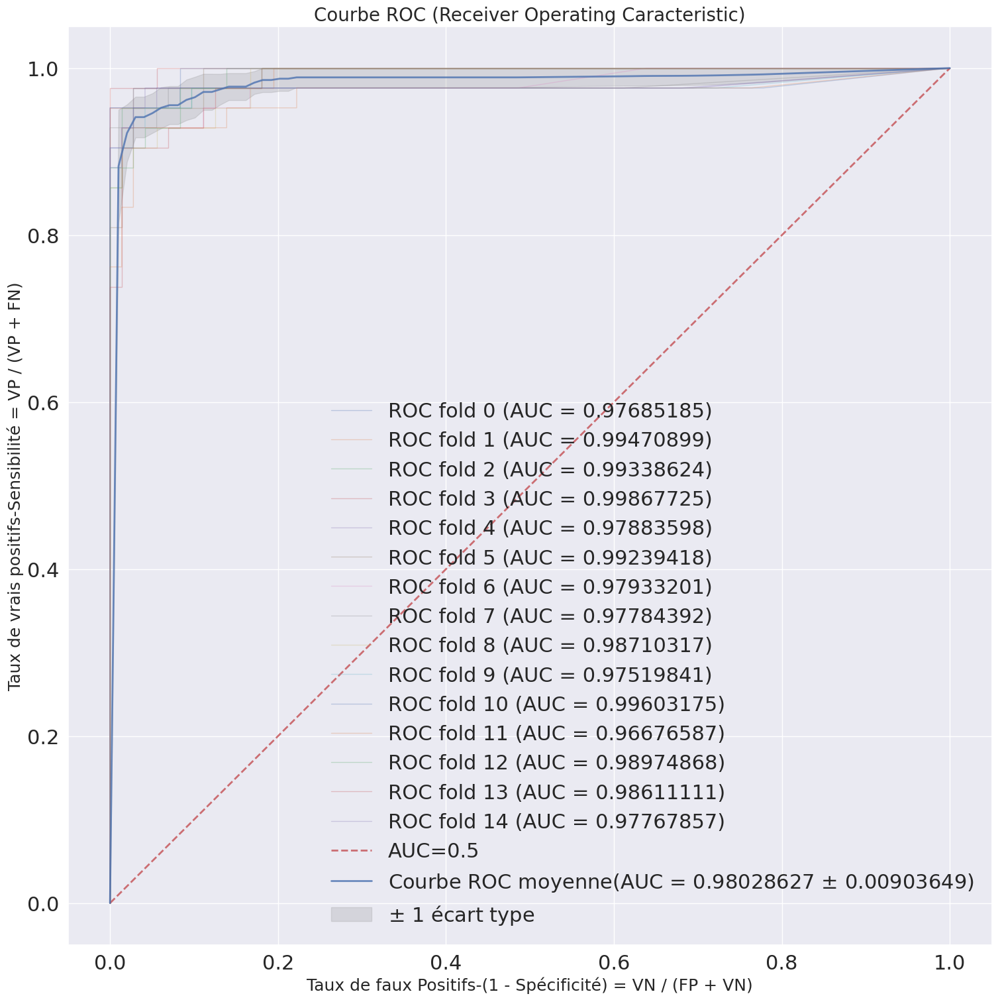

In [59]:
classificateurs = executeValidationCroisee(X = donnees_ft.loc[:,donnees_ft.filter(regex='Q100$', axis=1).columns].values, 
                         y = donnees_ft.loc[:,cible].apply(lambda x: dictDiagnosis[x]).values, 
                         classificateur=classificateursDict['Random_Forest'],
                         validation=StratifiedShuffleSplit(n_splits=15, test_size=0.2, random_state=0))

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Linear_SVM - StandardScaler</div></b>

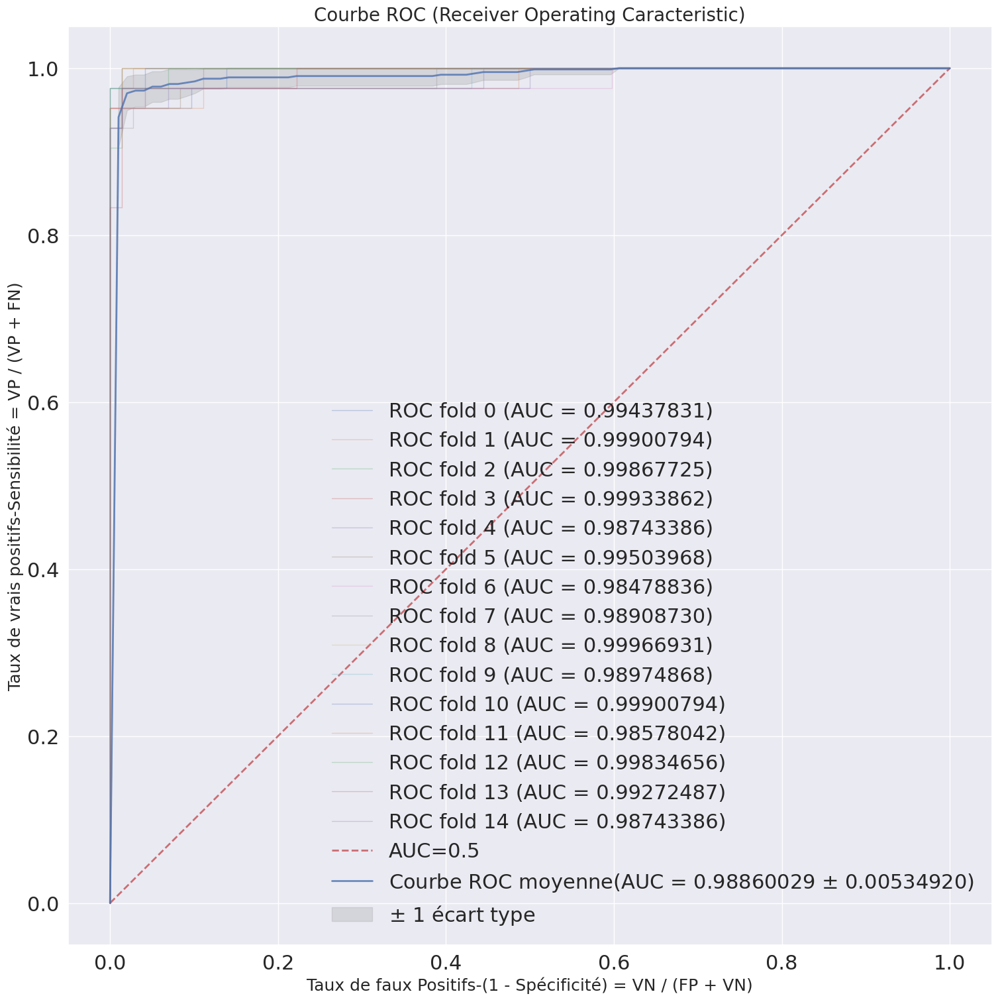

In [60]:
donnees = pd.read_parquet(os.path.join(repertoireDonnees,'donnees_echantillons.parquet'))
X = donnees.loc[:,donnees.drop(columns=[cible,'échantillon']).columns]
y = donnees.loc[:,cible].apply(lambda x: dictDiagnosis[x])
X[X.columns] = modelStd.transform(X)
X = X[X.filter(regex='(se|worst)$', axis=1).columns]

classificateurs = executeValidationCroisee(X = X.values, 
                         y = y.values, 
                         classificateur=classificateursDict['Linear_SVM'],
                         validation=StratifiedShuffleSplit(n_splits=15, test_size=0.2, random_state=0))

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Multiples classificateurs du même type</div></b>

In [61]:
donnees = pd.read_parquet(os.path.join(repertoireDonnees,'donnees_echantillons.parquet'))
X_train, X_test = \
                  donnees.loc[donnees['échantillon']=='apprentissage',donnees.drop(columns=[cible,'échantillon']).columns],\
                  donnees.loc[donnees['échantillon']=='test',donnees.drop(columns=[cible,'échantillon']).columns]

y_train, y_test = \
                  donnees.loc[donnees['échantillon']=='apprentissage',cible].apply(lambda x: dictDiagnosis[x]),\
                  donnees.loc[donnees['échantillon']=='test',cible].apply(lambda x: dictDiagnosis[x])

X_train[X_train.columns] = modelStd.transform(X_train)
X_test[X_test.columns] = modelStd.transform(X_test)

X_train = X_train[X_train.filter(regex='(se|worst)$', axis=1).columns]
X_test  = X_test[X_test.filter(regex='(se|worst)$', axis=1).columns]

In [62]:
n_splits=15
df = pd.DataFrame(data= y_test)
df.columns = ['y_test']
df['resultats'] = np.zeros(df.shape[0])

for i in range(n_splits):
    df['resultats'] += classificateurs[i].predict_proba(X_test)[:,1]

df['resultats'] /= n_splits

#df['y_pred'] = df.resultats.round()
df['y_pred'] = df.resultats.apply(lambda x : 1 if x < .5 else 0)

df.head()

,y_test,resultats,y_pred
id,,,
84358402,1,0.999998,0
844359,1,1.000000,0
844981,1,0.985436,0
846381,1,0.632958,0
851509,1,1.000000,0


In [63]:
pd.crosstab(df['y_pred'],df['y_test'])

y_test,0,1
y_pred,,
0,0,40
1,72,2


In [64]:
def afficheMetrics(y_test,y_pred):
    accuracy                 = accuracy_score (y_test,y_pred)
    logloss                  = log_loss       (y_test,y_pred)
    hammingloss              = hamming_loss   (y_test,y_pred)
    precision                = precision_score(y_test,y_pred)
    sensibilite              = recall_score   (y_test,y_pred)
    f1                       = f1_score       (y_test,y_pred)
    jaccard_similarity       = jaccard_score  (y_test,y_pred)
    print(
          " Accuracy           : %.2f%%\n" % (accuracy * 100.0),       
          "logloss            : %.6f\n" % logloss           ,
          "hammingloss        : %.6f\n" % hammingloss       ,
          "precision          : %.6f\n" % precision         ,
          "sensibilite        : %.6f\n" % sensibilite       ,
          "f1                 : %.6f\n" % f1                ,
          "jaccard_similarity : %.6f\n" % jaccard_similarity
         )
    return accuracy,logloss,hammingloss,precision,sensibilite,f1,jaccard_similarity

In [65]:
metriques = afficheMetrics(df.y_test,df.y_pred)

 Accuracy           : 1.75%
 logloss            : 35.411309
 hammingloss        : 0.982456
 precision          : 0.027027
 sensibilite        : 0.047619
 f1                 : 0.034483
 jaccard_similarity : 0.017544

